In [1]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

import dicom
import math
import scipy
import matplotlib.pyplot as plt
import numpy as np
import csv
import cv2
import os
import scipy.ndimage as ndimage

import matplotlib.patches as patches

from skimage.morphology import ball, disk, dilation, binary_erosion, remove_small_objects, erosion, closing, reconstruction, binary_closing
from skimage.measure import label,regionprops, perimeter
from skimage.morphology import binary_dilation, binary_opening
from skimage.filters import roberts, sobel
from skimage import measure, feature
from skimage.segmentation import clear_border
from skimage import data
from scipy import ndimage as ndi

In [2]:
#INPUT_FOLDER = 'kaggle_data/stage1/'
INPUT_FOLDER = '/Volumes/Seagate_Backup_Plus_Drive/LungCancerResearch/Luna_Data/all_data/'
patients = os.listdir(INPUT_FOLDER)
patients.sort()

patients_mhd = []
patients_mhd_names = []
for i in range(0,len(patients)):
    if patients[i][-1] == 'd':
        patients_mhd.append(patients[i])
        patients_mhd_names.append(patients[i][:-4])
               


In [3]:
with open('/Volumes/Seagate_Backup_Plus_Drive/LungCancerResearch/Luna_Data/CSVFILES/annotations.csv', mode='r') as infile:
    reader = csv.reader(infile)
    labels_dict = {rows[0]:[rows[1],rows[2],rows[3],rows[4]] for rows in reader}

print patients_mhd_names[0]
print labels_dict[patients_mhd_names[0]]

1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860
['103.7836509', '-211.9251487', '-227.12125', '4.224708481']


In [4]:
with open('/Volumes/Seagate_Backup_Plus_Drive/LungCancerResearch/Luna_Data/CSVFILES/annotations.csv', 'rb') as f:
    reader = csv.reader(f)
    annotations_list = list(reader)
    annotations_list = annotations_list[1:]


In [5]:
coords_dict={}
i=0
while (i<len(annotations_list)):
    name = annotations_list[i][0]
    coords = []
    for j in range(0,20):
        coords.append([float(annotations_list[i+j][1]),float(annotations_list[i+j][2]),float(annotations_list[i+j][3]),float(annotations_list[i+j][4])])
        try:
            if annotations_list[i+j+1][0] != name:
                break
        except:
            break
    coords_dict[name] = coords
    i = i + j + 1
    
print coords_dict['1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222365663678666836860']

[[-128.6994211, -175.3192718, -298.3875064, 5.651470635], [103.7836509, -211.9251487, -227.12125, 4.224708481]]


In [6]:
print coords_dict[patients_mhd_names[0]]

[[-128.6994211, -175.3192718, -298.3875064, 5.651470635], [103.7836509, -211.9251487, -227.12125, 4.224708481]]


In [7]:
def load_itk(filename):
    # Reads the image using SimpleITK
    itkimage = sitk.ReadImage(filename)

    # Convert the image to a  numpy array first and then shuffle the dimensions to get axis in the order z,y,x
    ct_scan = sitk.GetArrayFromImage(itkimage)

    # Read the origin of the ct_scan, will be used to convert the coordinates from world to voxel and vice versa.
    origin = np.array(list(reversed(itkimage.GetOrigin())))

    # Read the spacing along each dimension
    spacing = np.array(list(reversed(itkimage.GetSpacing())))

    return ct_scan, origin, spacing

In [8]:
def world_2_voxel(world_coordinates, origin, spacing):
    stretched_voxel_coordinates = np.absolute(world_coordinates - origin)
    voxel_coordinates = stretched_voxel_coordinates / spacing
    return voxel_coordinates


def voxel_2_world(voxel_coordinates, origin, spacing):
    stretched_voxel_coordinates = voxel_coordinates * spacing
    world_coordinates = stretched_voxel_coordinates + origin
    return world_coordinates

In [9]:
#patient_number = 35

#ct_scan, origin, spacing = load_itk(INPUT_FOLDER + patients_mhd[patient_number])
#coords = coords_dict[patients_mhd_names[patient_number]]
#voxel_coords = []
#new_coords1 = []
#for i in range(0,len(coords)):
#    image_coords = np.array((coords[i][2],coords[i][1],coords[i][0]))   
#    # Coords in (Z,Y,X)
#    new_coords = world_2_voxel(image_coords, origin, spacing)
#    slice_number = int(round(new_coords[0]))
#    radius = np.ceil(coords[i][3])/2
#    fig,ax = plt.subplots(1,figsize=(8,8))
#    ax.imshow(ct_scan[slice_number],cmap='gray')
#    circ = patches.Circle((new_coords[2],new_coords[1]),radius,linewidth=1,edgecolor='r',facecolor='none')
#    ax.add_patch(circ)
#    print slice_number
#print origin

In [10]:
# One way to segment lungs

def largest_label_volume(im, bg=-1):
    vals, counts = np.unique(im, return_counts=True)

    counts = counts[vals != bg]
    vals = vals[vals != bg]

    if len(counts) > 0:
        return vals[np.argmax(counts)]
    else:
        return None

def segment_lung_mask(image, fill_lung_structures=True):
    
    # not actually binary, but 1 and 2. 
    # 0 is treated as background, which we do not want
    binary_image = np.array(image > -320, dtype=np.int8)+1 
    #binary_image = np.array(image > -400, dtype=np.int8)+1  
    labels = measure.label(binary_image)
    
    # Pick the pixel in the very corner to determine which label is air.
    #   Improvement: Pick multiple background labels from around the patient
    #   More resistant to "trays" on which the patient lays cutting the air 
    #   around the person in half
    background_label = labels[0,0,0]
    
    #Fill the air around the person
    binary_image[background_label == labels] = 2
    
    selem = disk(2)
    
    # Method of filling the lung structures (that is superior to something like 
    # morphological closing)
    if fill_lung_structures:
        # For every slice we determine the largest solid structure
        for i, axial_slice in enumerate(binary_image):
            axial_slice = axial_slice - 1
            labeling = measure.label(axial_slice)
            l_max = largest_label_volume(labeling, bg=0)
            
            if l_max is not None: #This slice contains some lung
                binary_image[i][labeling != l_max] = 1

    
    binary_image -= 1 #Make the image actual binary
    binary_image = 1-binary_image # Invert it, lungs are now 1
    for i in range(0,binary_image.shape[0]):
        binary_image[i] = binary_closing(binary_image[i], selem)
    
    # Remove other air pockets insided body
    labels = measure.label(binary_image, background=0)
    l_max = largest_label_volume(labels, bg=0)
    if l_max is not None: # There are air pockets
        binary_image[labels != l_max] = 0
 
    return binary_image

In [11]:
def get_stacks(spacing, ct_scan, segmented_scan, M, K):
    stacks = []
    voxels = []
    # Cycle through each slice
    for k in range(0,len(ct_scan)):
        i=0
        # Cycle through every 25th pixel
        while (i<ct_scan[k].shape[0]):
            j=0
            while (j<ct_scan[k].shape[1]):
                
                # Check if the pixel is in lung region
                if (segmented_scan[k][i][j]==1):
#                    try:
                    # Keep a 7x50x50 stack from the scan
                    new_stack = ct_scan[k-K:k+K+1,i-int(M/2):i+int(M/2),j-int(M/2):j+int(M/2)]
                    dim_prod = new_stack.shape[0]*new_stack.shape[1]*new_stack.shape[2]
                    actual_prod = 7*M*M
                    if (dim_prod == actual_prod):
                        stacks.append(new_stack)
                        voxels.append((k,i,j))
#                    except:
#                        pass
                j = int(j + spacing)
            i = int(i + spacing)
        
    return stacks, voxels       

In [12]:
def get_stacks_nodules(ct_scan, M, K, nodule_coords):
    stacks = []
    voxels = []
    labels = []
    
    for l in range(0,len(nodule_coords)):
        center_points = nodule_coords[l][0]
        x,y,z = int(round(center_points[2])),int(round(center_points[1])),int(round(center_points[0]))
        radius = nodule_coords[l][1]
        width = int(round(radius))
        
        for k in range(z-width,z+width+1):
            for i in range(y-width,y+width+1):
                for j in range(x-width,x+width+1):
                    distance = ((j-x)*(j-x) + (i-y)*(i-y) + (k-z)*(k-z))
                    if (distance<(radius*radius)):
                        new_stack = ct_scan[k-K:k+K+1,i-int(M/2):i+int(M/2),j-int(M/2):j+int(M/2)]
                        dim_prod = new_stack.shape[0]*new_stack.shape[1]*new_stack.shape[2]
                        actual_prod = 7*M*M
                        if (dim_prod == actual_prod):
                            stacks.append(new_stack)
                            voxels.append((k,i,j))
                            label = 1
                            labels.append(label)
                        
    return stacks, voxels, labels

In [13]:
def get_stack_labels(nodule_coords, stack_voxels):
    stack_labels = []
    for i in range(0,len(stack_voxels)):
        nodule_or_not = 0
        for j in range(0,len(nodule_coords)):
            center_points = nodule_coords[j][0]
            cx,cy,cz = center_points[2],center_points[1],center_points[0]
            x,y,z = stack_voxels[i][2],stack_voxels[i][1],stack_voxels[i][0]
            radius = nodule_coords[j][1]
            
            distance = ((x-cx)*(x-cx) + (y-cy)*(y-cy) + (z-cz)*(z-cz))
            
            
            if (distance < (radius*radius)):
                nodule_or_not = nodule_or_not + 1
        if (nodule_or_not > 0):
            label = 1
        else:
            label = 0
        stack_labels.append(label)           
            
    return stack_labels
    

In [ ]:
all_stacks = []
all_voxels = []
all_labels = []

for patient_number in range(340,360):
    print patient_number
    
    # Load scan
    ct_scan, origin, spacing = load_itk(INPUT_FOLDER + patients_mhd[patient_number])
    
    # Set outside pixels to -1024
    for i in range(0,len(ct_scan)):
        ct_scan[i][ct_scan[i] == -2048] = -1024
    
    # Load coordinates from annotations dict
    try:
        coords = coords_dict[patients_mhd_names[patient_number]]
    except:
        coords = []
        pass
    image_coords = []
    new_coords = []
    
    # Cycle through all nodule coords for a scan
    for i in range(0,len(coords)):
        im_coords = np.array((coords[i][2],coords[i][1],coords[i][0])) 
        radius = np.ceil(coords[i][3])/2
        image_coords.append(im_coords)
        # Coords in (Z,Y,X)
        temp_coords = world_2_voxel(image_coords[i], origin, spacing)
        # new_coords contains (Z,Y,X) coords and radius
        new_coords.append((temp_coords,radius))
        
    
    # Segment lungs to obtain mask
    segmented_lungs = segment_lung_mask(ct_scan, False)
    segmented_lungs_fill = segment_lung_mask(ct_scan, True)
    
    # Get 7x50x50 stacks along with the voxel coords and labels: 1=nodular, 0=healthy
    M = 50
    stacks, voxels = get_stacks(25, ct_scan, segmented_lungs_fill, M, 3)
    stack_labels = get_stack_labels(new_coords,voxels)
    stacks_nodule, voxels_nodule, stack_labels_nodules = get_stacks_nodules(ct_scan, M, 3, new_coords)
    
    
    # Clear the coord lists
    del image_coords[:]
    del new_coords[:]
    del coords[:]
    
    # Append stacks,voxels,labels from this patient to overall stack list
    for q in range(0,len(stacks)):
        all_stacks.append(stacks[q])
        all_voxels.append(voxels[q])
        all_labels.append(stack_labels[q])
    for q in range(0,len(stacks_nodule)):
        all_stacks.append(stacks_nodule[q])
        all_voxels.append(voxels_nodule[q])
        all_labels.append(stack_labels_nodules[q])

340
341
342
343


In [ ]:
print(len(all_stacks),len(all_labels),len(all_voxels))


In [ ]:
features = np.asarray(all_stacks)
labels = np.asarray(all_labels)
voxels = np.asarray(all_voxels)

In [ ]:
import h5py
fname = '/Volumes/Seagate_Backup_Plus_Drive/LungCancerResearch/hdf5_files_luna/image_stacks/image_stacks18_7x50x50_p340-359.h5'
h5File=h5py.File(fname,'w')
h5File.create_dataset('feature_stacks', data=features)
h5File.create_dataset('labels', data=labels)
h5File.create_dataset('voxels', data=voxels)
h5File.flush() 
h5File.close()

In [18]:
import h5py
filename = '/Volumes/Seagate_Backup_Plus_Drive/LungCancerResearch/hdf5_files_luna/image_stacks/image_stacks_set1_p0-19.h5'
f = h5py.File(filename, 'r')

data = f['feature_stacks']
data2 = f['labels']
data3 = f['voxels']
print data.shape
print data2[120000]
print data3[120000]

print sum(data2)

plt.imshow(data[120000][4], cmap = 'gray')
f.close()

IOError: Unable to open file (Unable to open file: name = '/volumes/seagate_backup_plus_drive/lungcancerresearch/hdf5_files_luna/image_stacks/image_stacks_set1_p0-19.h5', errno = 2, error message = 'no such file or directory', flags = 0, o_flags = 0)

In [16]:
import random

indices = list(range(len(all_stacks)))
random.shuffle(indices)

all_features = zeros((len(all_stacks),7,M,M))
all_labels2 = zeros((len(all_stacks),1))

for i in range(0,len(all_stacks)):
    all_features[i] = all_stacks[indices[i]]
    all_labels2[i] = all_labels[indices[i]]



0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490
1500
1510
1520
1530
1540
1550
1560
1570
1580
1590
1600
1610
1620
1630
1640
1650
1660
1670
1680
1690
1700
1710
1720
1730
1740
1750
1760
1770
1780
1790
1800
1810
1820
1830
1840
1850
1860
1870
1880
1890
1900
1910
1920
1930
1940
1950
1960
1970
1980
1990
2000
2010
2020
2030
2040
2050
2060
2070
2080
2090
2100
2110
2120
2130
2140
2150
2160
2170
2180
2190
2200
2210
2

In [28]:
print len(all_stacks)

NameError: name 'all_stacks' is not defined

In [ ]:
num_train_samples = int(round(0.8*len(all_stacks)))
num_test_samples = len(all_stacks)-num_train_samples

train_features = zeros((num_train_samples,7,M,M))
test_features = zeros((num_test_samples,7,M,M))
train_labels = zeros((num_train_samples,1))
test_labels = zeros((num_test_samples,1))

for i in range(0,num_train_samples):
    train_features[i] = all_features[i]
    train_labels[i] = all_labels[i]
    
for i in range(0,num_test_samples):
    test_features[i] = all_features[num_train_samples+i]
    test_labels[i] = all_labels[num_train_samples+i]
        
print len(train_data),len(test_data)

In [ ]:
import numpy as np
import tensorflow as tf

from tensorflow.contrib import learn
from tensorflow.contrib.learn.python.learn.estimators import model_fn as model_fn_lib

tf.logging.set_verbosity(tf.logging.INFO)

if __name__ == "__main__":
  tf.app.run()

In [ ]:
def cnn_model_fn(features, labels, mode):
  """Model function for CNN."""
  # Input Layer
  input_layer = tf.reshape(features, [-1, 50, 50, 7])

  # Convolutional Layer #1
  conv1 = tf.layers.conv2d(
      inputs=input_layer,
      filters=32,
      kernel_size=[5, 5],
      padding="valid",
      activation=tf.nn.relu)
    
    # Convolutional Layer #2
  conv2 = tf.layers.conv2d(
      inputs=conv1,
      filters=32,
      kernel_size=[3, 3],
      padding="valid",
      activation=tf.nn.relu)

  # Pooling Layer #1
  pool1 = tf.layers.max_pooling2d(inputs=conv2, pool_size=[2, 2], strides=2)

  # Convolutional Layer #3 
  conv3 = tf.layers.conv2d(
      inputs=pool1,
      filters=64,
      kernel_size=[3, 3],
      padding="valid",
      activation=tf.nn.relu)
    
    # Convolutional Layer #4
  conv4 = tf.layers.conv2d(
      inputs=conv3,
      filters=64,
      kernel_size=[3, 3],
      padding="valid",
      activation=tf.nn.relu)
    
    # Pooling Layer #2
  pool2 = tf.layers.max_pooling2d(inputs=conv4, pool_size=[2, 2], strides=2)
    
    # Convolutional Layer #5
  conv5 = tf.layers.conv2d(
      inputs=pool2,
      filters=96,
      kernel_size=[2, 2],
      padding="valid",
      activation=tf.nn.relu)
    
    # Pooling Layer #3
  pool3 = tf.layers.max_pooling2d(inputs=conv3, pool_size=[2, 2], strides=2)


  # Dense Layer 1
  pool3_flat = tf.reshape(pool3, [-1, 8 * 8 * 96])
  dense = tf.layers.dense(inputs=pool3_flat, units=816, activation=tf.nn.relu)
#  dropout = tf.layers.dropout(
#      inputs=dense, rate=0.4, training=mode == learn.ModeKeys.TRAIN)

  # Dense Layer 2
  dense2 = tf.layers.dense(inputs=dense, units=412, activation=tf.nn.relu)

  # Logits Layer
  logits = tf.layers.dense(inputs=dense2, units=10)

  loss = None
  train_op = None

  # Calculate Loss (for both TRAIN and EVAL modes)
  if mode != learn.ModeKeys.INFER:
    onehot_labels = tf.one_hot(indices=tf.cast(labels, tf.int32), depth=10)
    loss = tf.losses.softmax_cross_entropy(
        onehot_labels=onehot_labels, logits=logits)

  # Configure the Training Op (for TRAIN mode)
  if mode == learn.ModeKeys.TRAIN:
    train_op = tf.contrib.layers.optimize_loss(
        loss=loss,
        global_step=tf.contrib.framework.get_global_step(),
        learning_rate=0.001,
        optimizer="SGD")

  # Generate Predictions
  predictions = {
      "classes": tf.argmax(
          input=logits, axis=1),
      "probabilities": tf.nn.softmax(
          logits, name="softmax_tensor")
  }

  # Return a ModelFnOps object
  return model_fn_lib.ModelFnOps(
      mode=mode, predictions=predictions, loss=loss, train_op=train_op)

In [ ]:
# Create the Estimator
nodule_classifier = learn.Estimator(
      model_fn=cnn_model_fn, model_dir="/tmp/lung_cancer_convnet_model")

In [ ]:
# Set up logging for predictions
  tensors_to_log = {"probabilities": "softmax_tensor"}
  logging_hook = tf.train.LoggingTensorHook(
      tensors=tensors_to_log, every_n_iter=50)

In [ ]:
# Train the model
mnist_classifier.fit(
    x=train_features,
    y=train_labels,
    batch_size=100,
    steps=20000,
    monitors=[logging_hook])

In [ ]:
# Configure the accuracy metric for evaluation
metrics = {
    "accuracy":
        learn.MetricSpec(
            metric_fn=tf.metrics.accuracy, prediction_key="classes"),
}

In [ ]:
# Evaluate the model and print results
eval_results = nodule_classifier.evaluate(
    x=test_features, y=test_labels, metrics=metrics)
print(eval_results)

(array([  1.26364020e+07,   1.52404600e+06,   2.65820700e+06,
          7.68845000e+05,   7.96161000e+05,   5.18242000e+05,
          2.78068000e+05,   1.81047000e+05,   1.20916000e+05,
          9.83600000e+04,   9.01010000e+04,   8.52220000e+04,
          8.91930000e+04,   9.28520000e+04,   9.75380000e+04,
          1.06900000e+05,   1.11889000e+05,   9.80391000e+05,
          1.76812400e+06,   8.79517000e+05,   2.14904900e+06,
          2.63665600e+06,   7.46198000e+05,   3.29466000e+05,
          2.45713000e+05,   1.87073000e+05,   1.03416000e+05,
          6.96420000e+04,   5.60630000e+04,   4.64880000e+04,
          3.88760000e+04,   3.18710000e+04,   2.74180000e+04,
          2.23560000e+04,   1.81580000e+04,   1.47810000e+04,
          1.20890000e+04,   9.91900000e+03,   7.79600000e+03,
          6.22300000e+03,   4.83400000e+03,   3.75300000e+03,
          2.86200000e+03,   2.04700000e+03,   1.55900000e+03,
          1.23300000e+03,   8.21000000e+02,   5.89000000e+02,
        

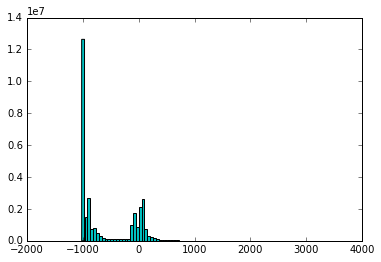

In [40]:
plt.hist(ct_scan.flatten(), bins=80, color='c')

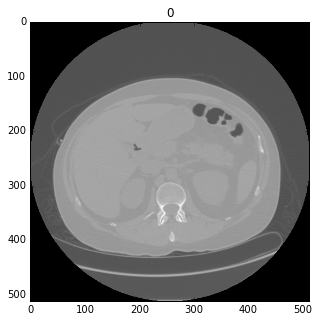

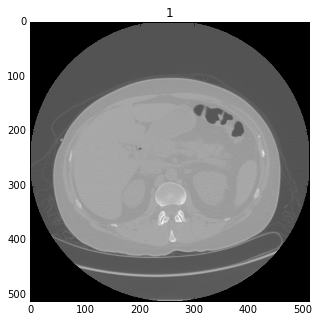

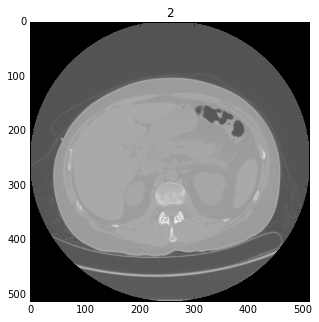

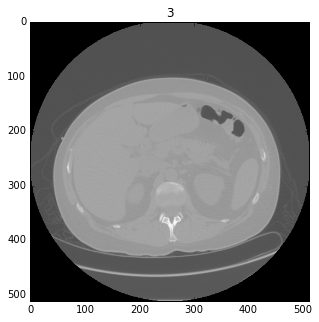

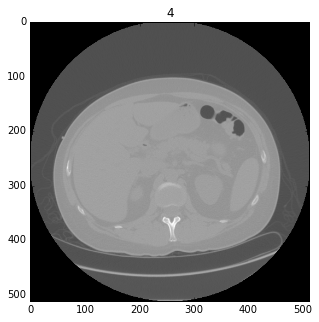

...

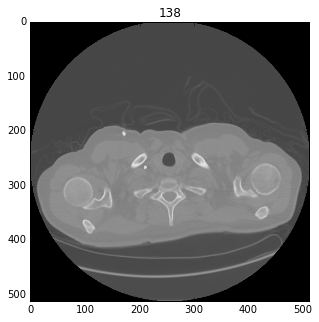

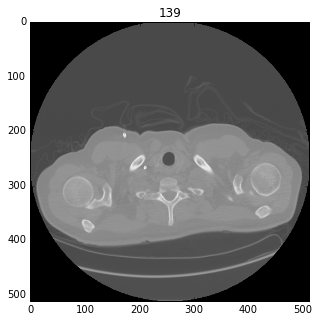

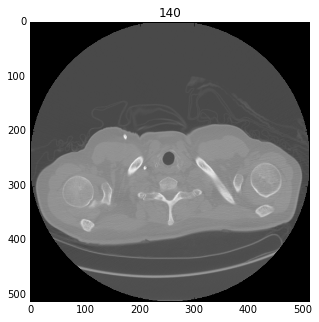

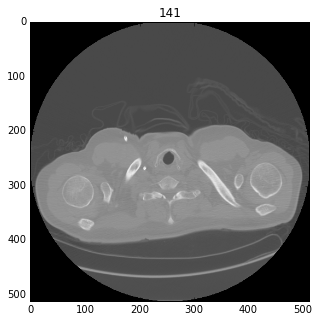

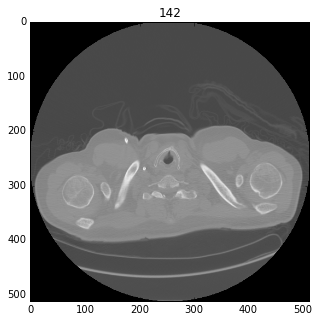

In [51]:
for i in range(0,ct_scan.shape[0]):
    plt.figure(figsize=(5,5))
    plt.title(i)
    plt.imshow(ct_scan[i],cmap='gray')

In [19]:
print all_stacks[len(all_stacks)-1].shape

(7, 0, 50)
